## Görüntü Özellikleri Çıkarımı (Proje: Image Features Extraction)

## 1. Gerekli Kütüphaneler:

In [1]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import os

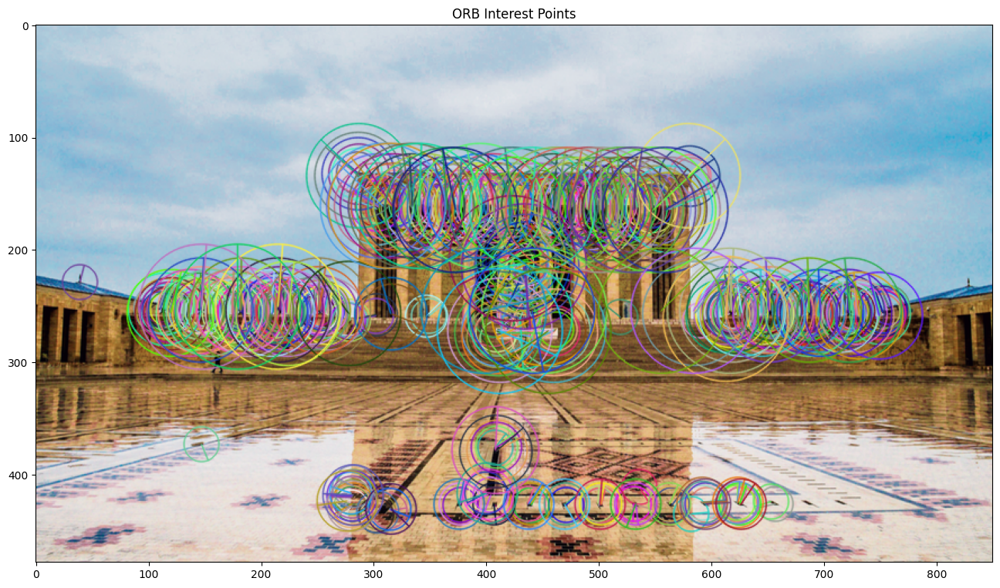

In [2]:
img_building_1 = cv2.imread(os.path.join('anitkabir.jpeg'))
img_building_1 = cv2.cvtColor(img_building_1, cv2.COLOR_BGR2RGB)
orb = cv2.ORB_create()  # OpenCV 3 backward incompatibility: Do not create a detector with `cv2.ORB()`.
key_points, description = orb.detectAndCompute(img_building_1, None)
img_building_1_keypoints = cv2.drawKeypoints(img_building_1, 
                                           key_points, 
                                           img_building_1, 
                                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) # Draw circles.
plt.figure(figsize=(16, 16))
plt.title('ORB Interest Points')
plt.imshow(img_building_1_keypoints) 
plt.show()

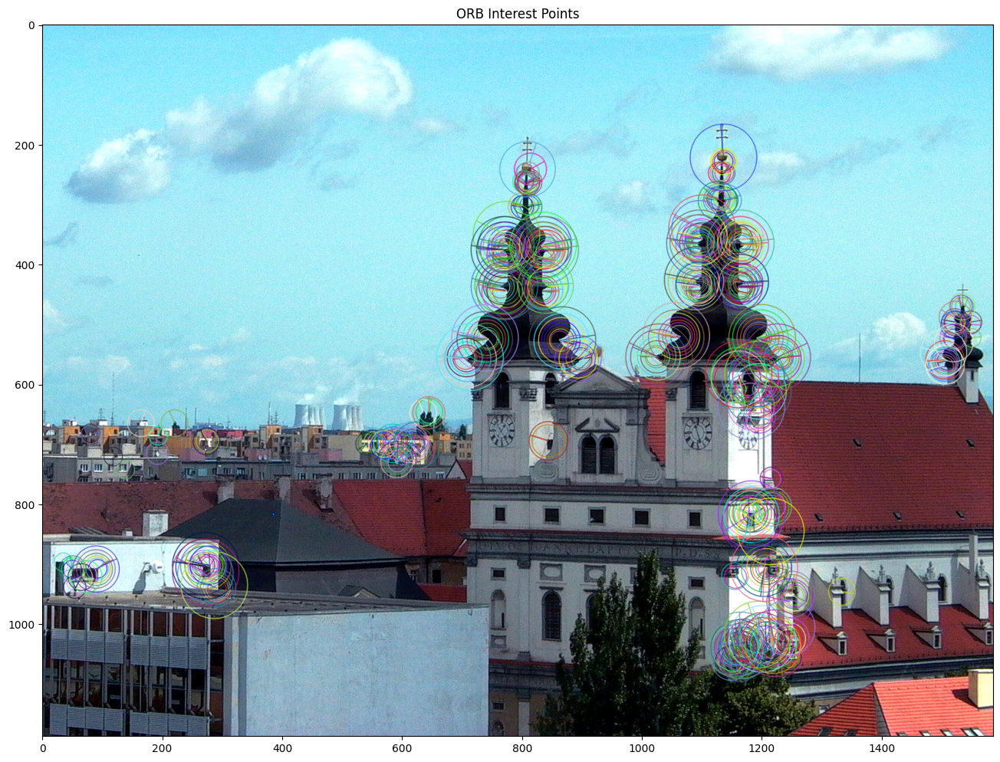

In [3]:
img_building = cv2.imread(os.path.join('un.png'))
img_building = cv2.cvtColor(img_building, cv2.COLOR_BGR2RGB)
orb = cv2.ORB_create()  # OpenCV 3 backward incompatibility: Do not create a detector with `cv2.ORB()`.
key_points, description = orb.detectAndCompute(img_building, None)
img_building_keypoints = cv2.drawKeypoints(img_building, 
                                           key_points, 
                                           img_building, 
                                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) # Draw circles.
plt.figure(figsize=(16, 16))
plt.title('ORB Interest Points')
plt.imshow(img_building_keypoints) 
plt.show()

Yukarıdaki görüntüde bulunan görüntü özelliklerinin noktaları daire içine alınmıştır. Gördüğümüz gibi, bu noktaların bazıları bu binaya özgüdür, iki kulenin tepesine yakın noktalar gibi. Ancak, ağacın tepesindekiler gibi diğerleri ayırt edici olmayabilir.

## Özellik Eşleştirme

Şimdi, farklı bir açıdan çekilen görüntüden aynı özellikleri çıkarıp çıkaramayacağımıza bakalım

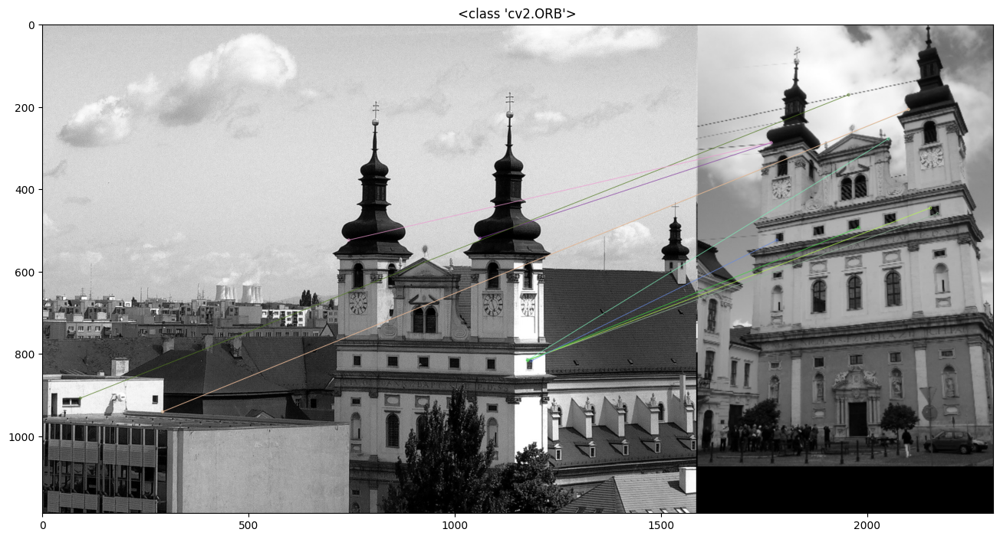

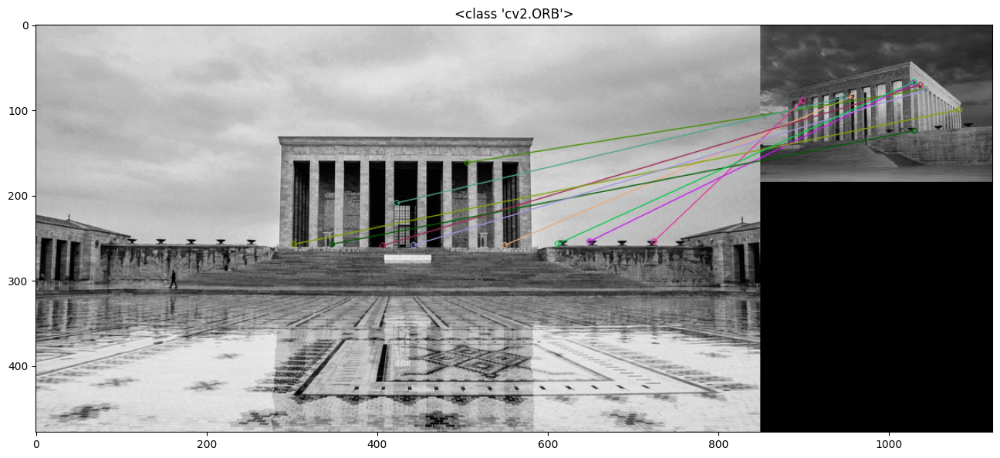

In [4]:
def image_detect_and_compute(detector, img_name):
    img = cv2.imread(img_name)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    kp, des = detector.detectAndCompute(img, None)
    return img, kp, des
    

def draw_image_matches(detector, img1_name, img2_name, nmatches=10):

    img1, kp1, des1 = image_detect_and_compute(detector, img1_name)
    img2, kp2, des2 = image_detect_and_compute(detector, img2_name)
    
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key = lambda x: x.distance) # Sort matches by distance.  Best come first.
    
    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:nmatches], img2, flags=2) # Show top 10 matches
    plt.figure(figsize=(16, 16))
    plt.title(type(detector))
    plt.imshow(img_matches)
    plt.show()
    

orb = cv2.ORB_create()
draw_image_matches(orb, 'un.png', 'home.png')
draw_image_matches(orb, 'anitkabir.jpeg', 'anitkabir_1.jpeg')

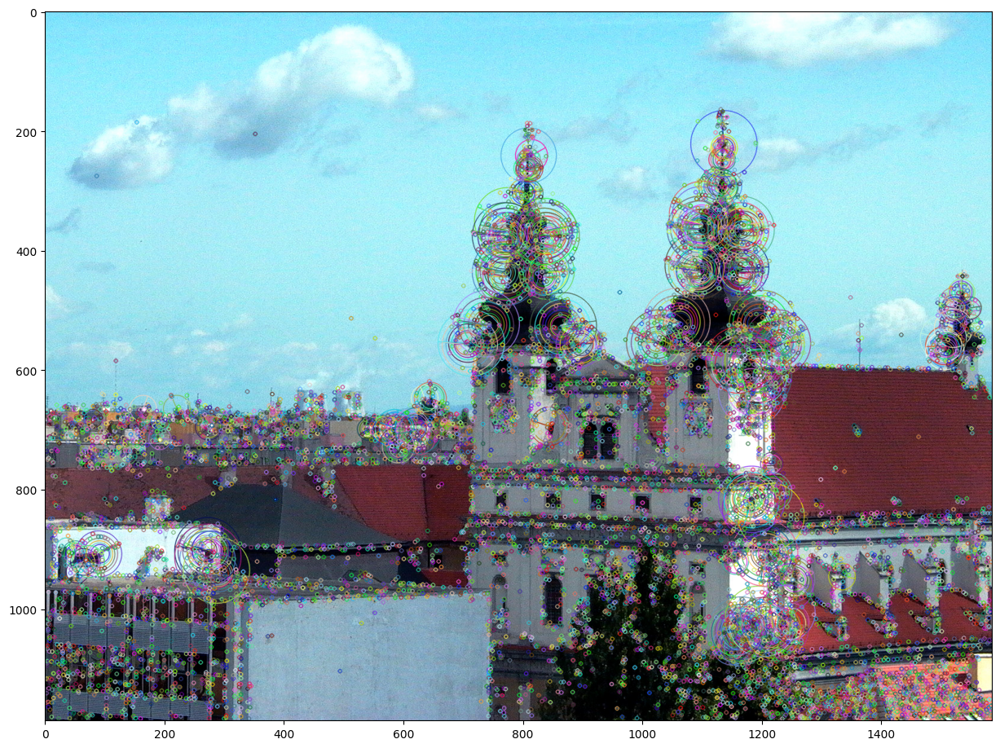

In [5]:
sift = cv2.SIFT_create()
kp, des = sift.detectAndCompute(img_building, None)
img_kp = cv2.drawKeypoints(img_building, kp, img_building)

plt.figure(figsize=(15, 15))
plt.imshow(img_kp)
plt.show()

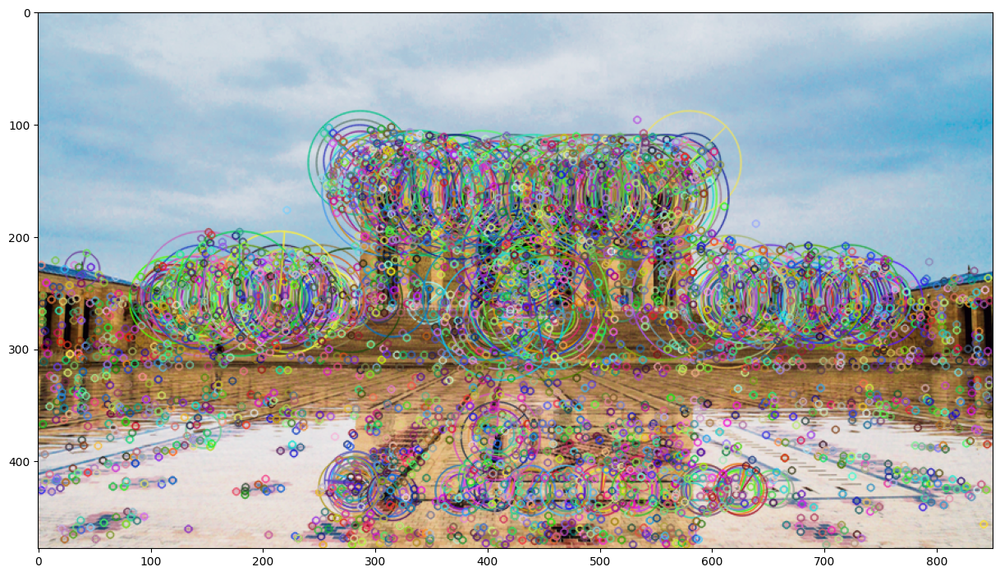

In [6]:
sift = cv2.SIFT_create()
kp, des = sift.detectAndCompute(img_building_1, None)
img_kp = cv2.drawKeypoints(img_building_1, kp, img_building_1)

plt.figure(figsize=(15, 15))
plt.imshow(img_kp)
plt.show()

## Sonuç:

İlk 10 eşleşmenin yarısından fazlası doğruydu. Gerçek uygulamalarda, ilk n eşleşmeyi kullanmak yerine, sahte eşleşmeleri filtrelemek için bir eşleşme mesafesi eşiği kullanılır.